## Q2.1 Creating Dataset

#### Importing Libraries and basic setup

In [1]:
# importing the required libraries
import os
import torch
import pandas as pd
import numpy as np
from PIL import Image as im
import matplotlib.pyplot as plt
from torch.utils.data import Dataset, DataLoader, random_split, Subset, SubsetRandomSampler
from torchvision import utils
from torchvision.transforms import v2 as transforms
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from sklearn.metrics import f1_score, precision_score, recall_score, confusion_matrix
from sklearn.manifold import TSNE
from sklearn.model_selection import train_test_split

# Ignore warnings
import warnings
warnings.filterwarnings("ignore")

#### GPU Setup

In [2]:
# checking pytorch version
print(torch.__version__)

2.2.0


In [3]:
import torchvision
# checking if cuda is available
torch.cuda.is_available()

True

In [4]:
# setting the device to cuda is available
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print(device)

cuda:0


In [5]:
# File handling
current_path = os.getcwd()
new_path = os.path.join(current_path, 'Cropped_final/Cropped_final')
os.chdir(new_path)
for i in os.listdir():
    print(i)

amur_leopard
amur_tiger
birds
black_bear
brown_bear
dog
people
roe_deer
sika_deer
wild_boar


#### Dataset Class

In [6]:
class RussianWildLifeDataset(Dataset):
  def __init__(self, root_dir, transform):
    self.transform = transform
    self.root_dir = root_dir
    self.classes = os.listdir(self.root_dir)
    self.classes.sort()
    self.class_index_mapping = dict(zip(range(len(self.classes)), self.classes))
    self.__load_data__()
    self.num_classes = torch.unique(torch.tensor(self.labels)).size(0)
    
  def __load_data__(self):
    self.images_filenames = []
    self.labels = []
    for i in range(len(self.class_index_mapping)):
      # go to the class directory
      os.chdir(new_path)
      class_path = os.path.join(self.root_dir, self.class_index_mapping[i])
      for image in os.listdir(class_path):
        self.images_filenames.append(os.path.join(class_path, image))
        self.labels.append(i)

  def get_class_name(self, label):
    return self.class_index_mapping[label]

  def __len__(self):
    return len(self.labels)

  def __getitem__(self, idx):
    image = im.open(self.images_filenames[idx])
    label = self.labels[idx]
    if (self.transform):
      image = self.transform(image)
    label_value = label
    sample = {'image': image, 'label': label}
    return sample

#### Transforms

In [7]:
composed_transform = transforms.Compose([
    transforms.Resize([224, 224]),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])
])

#### Dataloader splitting

In [8]:
train_size = 0.7
val_size = 0.1
test_size = 0.2
batch_size = 16
run_num = 2

In [9]:
dataset = RussianWildLifeDataset(new_path, composed_transform)

In [10]:
class_wise_indices = [np.where(np.array(dataset.labels) == i)[0] for i in range(len(dataset.classes))]
class_distribution = [len(indices) for indices in class_wise_indices]
train_class_distribution = [int(train_size * dist) for dist in class_distribution]
val_class_distribution = [int(val_size * dist) for dist in class_distribution]
test_class_distribution = [int(test_size * dist) for dist in class_distribution]

In [11]:
train_indices = []
val_indices = []
test_indices = []
for i in range(len(dataset.classes)):
    np.random.shuffle(class_wise_indices[i])
    train_indices.extend(np.random.choice(class_wise_indices[i], train_class_distribution[i], replace=False))
    val_indices.extend(np.random.choice(np.setdiff1d(class_wise_indices[i], train_indices), val_class_distribution[i], replace=False))
    test_indices.extend(np.random.choice(np.setdiff1d(class_wise_indices[i], np.concatenate((train_indices, val_indices))), test_class_distribution[i], replace=False))

In [12]:
train_data = Subset(dataset, train_indices)
val_data = Subset(dataset, val_indices)
test_data = Subset(dataset, test_indices)
train_dataloader = DataLoader(train_data, batch_size=batch_size, shuffle=True)
val_dataloader = DataLoader(val_data, batch_size=1, shuffle=True)
test_dataloader = DataLoader(test_data, batch_size=1, shuffle=True)

In [13]:
train_size = len(train_data)
val_size = len(val_data)
test_size = len(test_data)
print(train_size, val_size, test_size)

8973 1276 2560


#### Data Distribution Visualization

In [14]:
def plot_distribution(data, title):
  labels = [sample['label'] for sample in data]
  unique, counts = np.unique(labels, return_counts=True)
  plt.bar(unique, counts)
  plt.title(title)
  plt.show()

In [ ]:
plot_distribution(train_data, 'Train set')

In [ ]:
plot_distribution(val_data, 'Validation set')

#### WandB Setup

In [15]:
print(os.getcwd())
os.chdir("..")
os.chdir("..")
print(os.getcwd())

c:\Users\prakh\Prakhar\College\Semester 6\Computer Vision\cse344\Image Classification\Cropped_final\Cropped_final
c:\Users\prakh\Prakhar\College\Semester 6\Computer Vision\cse344\Image Classification


In [36]:
import wandb
wandb.login()

Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: Currently logged in as: prakhar432. Use `wandb login --relogin` to force relogin


True

In [37]:
# force relogin
wandb.login(relogin=True)

wandb: Logging into wandb.ai. (Learn how to deploy a W&B server locally: https://wandb.me/wandb-server)
wandb: You can find your API key in your browser here: https://wandb.ai/authorize
wandb: Paste an API key from your profile and hit enter, or press ctrl+c to quit:wandb: Appending key for api.wandb.ai to your netrc file: /home/mehar21541/.netrc


True

In [16]:
model_config = dict(
    epochs=10,
    classes=10,
    kernels=[3, 3, 3],
    features=[32, 64, 128],
    batch_size=batch_size,
    optimizer="Adam",
    learning_rate=0.001,
    dataset="Russian WildLife Dataset",
    architecture="CNN", 
    weight_initialisation="Default")

In [39]:
wandb.init(
    project = "Computer_Vision_A1",
    config = model_config,
)

#### Data Visualization

In [17]:
def data_visualization(data):
    num_rows = 3
    num_cols = 5
    fig, axes = plt.subplots(num_rows, num_cols, figsize=(2*num_cols,2*num_rows))
    for i in range(num_rows):
        for j in range(num_cols):
            sample = train_data[np.random.randint(0, len(train_data))]
            image, label = sample['image'], sample['label']
            image = transforms.ToPILImage()((((sample['image']+1)/2) * 255).squeeze().to(torch.uint8))
            axes[i, j].imshow(image)
            axes[i, j].set_title(dataset.get_class_name(label))
            axes[i, j].axis('off')
    plt.show()

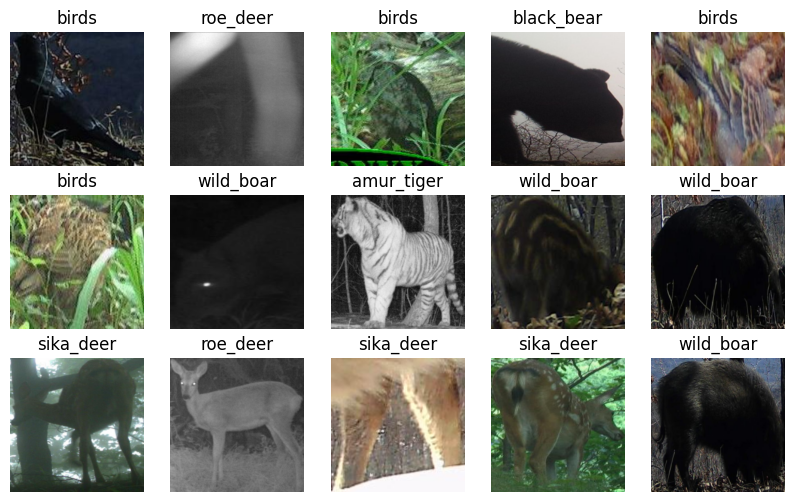

In [18]:
data_visualization(train_data)

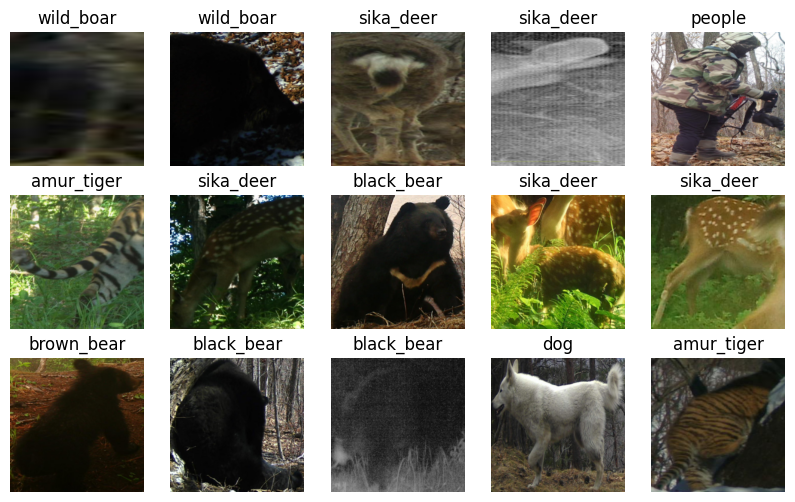

In [19]:
data_visualization(val_data)

## Q2.2 Training a CNN Model 

#### CNN Architecture and Model Definition

In [20]:
class ConvNet(nn.Module):
  def __init__(self):
    super().__init__()
    self.conv_layer1 = nn.Sequential(
        # First Convolutional Layer
        nn.Conv2d(in_channels=3, out_channels=32, kernel_size=3, stride=1, padding=1),
        nn.ReLU(),
        nn.MaxPool2d(kernel_size=4, stride=4)
    )
    self.conv_layer2 = nn.Sequential(
        # Second Convolutional Layer
        nn.Conv2d(in_channels=32, out_channels=64, kernel_size=3, stride=1, padding=1),
        nn.ReLU(),
        nn.MaxPool2d(kernel_size=2, stride=2)
    )
    self.conv_layer3 = nn.Sequential(
        # Third Convolutional Layer
        nn.Conv2d(in_channels=64, out_channels=128, kernel_size=3, stride=1, padding=1),
        nn.ReLU(),
        nn.MaxPool2d(kernel_size=2, stride=2)
    )
    self.fully_connected = nn.Sequential(
        nn.Linear(128*14*14, 10)
    )
    self.Softmax = nn.Softmax(dim=1)

  def forward(self, x):
    x = self.conv_layer1(x)
    x = self.conv_layer2(x)
    x = self.conv_layer3(x)
    x = torch.flatten(x, 1)
    logits = self.fully_connected(x)
    return logits

  def softmax(self, x):
    x = self.Softmax(x)
    return x

In [21]:
model = ConvNet()
loss_fn = nn.CrossEntropyLoss()
loss_fn.to(device)
optimizer = optim.Adam(model.parameters(), lr=0.001)
# move the model to the gpu
model.to(device)

ConvNet(
  (conv_layer1): Sequential(
    (0): Conv2d(3, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU()
    (2): MaxPool2d(kernel_size=4, stride=4, padding=0, dilation=1, ceil_mode=False)
  )
  (conv_layer2): Sequential(
    (0): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU()
    (2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (conv_layer3): Sequential(
    (0): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU()
    (2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (fully_connected): Sequential(
    (0): Linear(in_features=25088, out_features=10, bias=True)
  )
  (Softmax): Softmax(dim=1)
)

#### Logging Function

In [22]:
def loss_acc_calc(dataloader):
  model.eval()
  with torch.no_grad():
    correct, total, loss = 0, 0, 0.0
    for i, sample in enumerate(dataloader, 0):
      images = sample['image']
      labels = sample['label']
      images = images.to(device)
      labels = torch.tensor(labels).to(device)
      forwards = model.forward(images)
      logits = torch.nn.functional.softmax(forwards, dim=1)
      preds = torch.argmax(logits, dim=1)
      correct += torch.eq(preds, labels).sum().item()
      total += labels.size(0)
      loss_val = loss_fn(forwards, labels)
      loss += loss_val.item()
  return correct, total, loss

#### Model Training

In [46]:
wandb.watch(model)

[]

In [23]:
def train_model(model, model_config, loss_fn, optimizer, train_dataloader, val_dataloader):
    running_loss = 0.0
    model.train()
    for epoch in range(model_config['epochs']):
        for i, sample in enumerate(train_dataloader, 0):
            inputs = sample['image']
            labels = sample['label']
            inputs = inputs.to(device)
            labels = torch.tensor(labels).to(device)
            # zero the gradients before backprop
            optimizer.zero_grad()
            # forward pass
            logits = model.forward(inputs)
            loss = loss_fn(logits, labels)
            # backward pass
            loss.backward()
            optimizer.step()
            minibatch_loss = loss.item()
            running_loss += minibatch_loss
            # logging the minibatch after every batch, and running loss after every 100 minibatches
            wandb.log({'minibatch_loss': minibatch_loss})
            if (i%100==0):
                wandb.log({'running_loss': running_loss / 100})
                running_loss = 0.0
        # log the training accuracy and loss
        correct, total, loss = loss_acc_calc(train_dataloader)
        wandb.log({'train_loss': loss / len(train_dataloader), 'train_accuracy': (correct / total) * 100.0})
        # log the validation accuracy and loss
        correct, total, loss = loss_acc_calc(val_dataloader)
        wandb.log({'val_loss': loss / len(val_dataloader), 'val_accuracy': (correct / total) * 100.0})
    # save the model after training
    torch.save(model.state_dict(), f"A1_Q2_CNN_Experiment_{run_num}.pth")
    return model

In [48]:
# training the model 
model = train_model(model, model_config, loss_fn, optimizer, train_dataloader, val_dataloader)

#### Model Evaluation

In [24]:
def evaluation_metris_calc(dataloader):
    y_true = []
    y_pred = []
    for i, sample in enumerate(dataloader, 0):
        images = sample['image']
        labels = sample['label']
        images = images.to(device)
        labels = torch.tensor(labels).to(device)
        forwards = model.forward(images)
        logits = torch.nn.functional.softmax(forwards, dim=1)
        preds = torch.argmax(logits, dim=1)
        y_true.extend(labels.cpu().numpy())
        y_pred.extend(preds.cpu().numpy())
    return y_true, y_pred

In [50]:
# testing the model 
correct, total, loss = loss_acc_calc(test_dataloader)
print(f"Test Accuracy: {(correct / total) * 100.0}%")
wandb.log({'test_accuracy': (correct / total) * 100.0})
# calculate the metrics
y_true, y_pred = evaluation_metris_calc(test_dataloader)
f1 = f1_score(y_true, y_pred, average='weighted')
precision = precision_score(y_true, y_pred, average='weighted')
recall = recall_score(y_true, y_pred, average='weighted')
print(f"F1 Score: {f1}")
print(f"Precision: {precision}")
print(f"Recall: {recall}")
# logging the metrics onto wandb
wandb.run.summary["test_accuracy"] = (correct / total) * 100.0
wandb.run.summary["f1_score"] = f1
wandb.run.summary["precision"] = precision
wandb.run.summary["recall"] = recall

Test Accuracy: 65.9375%
F1 Score: 0.6585133121155642
Precision: 0.6597975267778609
Recall: 0.659375


#### Confusion Matrix 

In [25]:
def plotting_confusion_matrix(dataloader, file_name):
    # calculate the confusion matrix using sklearn 
    y_true, y_pred = evaluation_metris_calc(dataloader)
    cm = confusion_matrix(y_true, y_pred)
    # plot the confusion matrix with numbers
    fig, ax = plt.subplots(figsize=(10, 10))
    im = ax.imshow(cm, interpolation='nearest', cmap='viridis')
    ax.figure.colorbar(im, ax=ax)
    ax.set(xticks=np.arange(cm.shape[1]),
           yticks=np.arange(cm.shape[0]),
           xticklabels=dataset.classes, yticklabels=dataset.classes,
           title="Confusion Matrix",
           ylabel='True label',
           xlabel='Predicted label')
    plt.setp(ax.get_xticklabels(), rotation=45, ha="right", rotation_mode="anchor")
    for i in range(cm.shape[0]):
        for j in range(cm.shape[1]):
            ax.text(j, i, format(cm[i, j], 'd'), ha="center", va="center", color="white" if cm[i, j] > cm.max() / 2. else "black")
    fig.tight_layout()
    plt.show()
    # save the confusion matrix 
    fig.savefig(file_name)

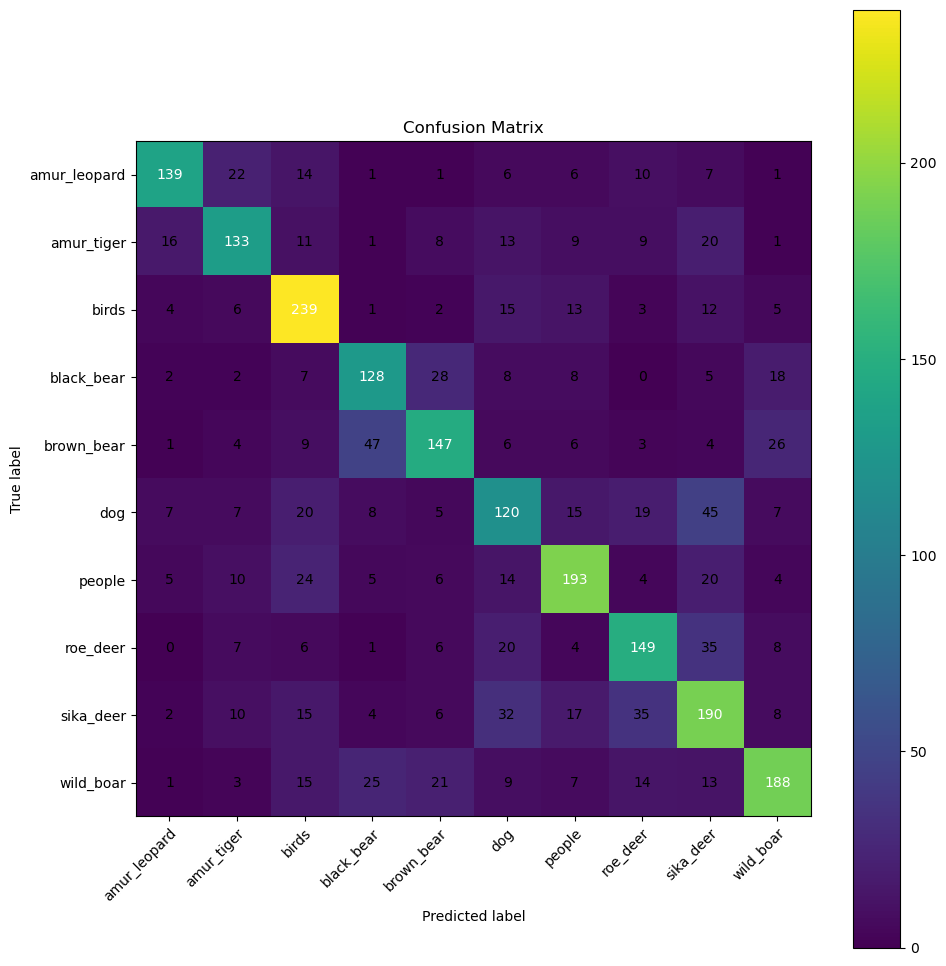

In [36]:
# plot the confusion matrix for the test set
plotting_confusion_matrix(test_dataloader, f"A1_Q2_CNN_Experiment_{run_num}_Confusion_Matrix")

#### Analysing the misclassified images (BONUS)

In [26]:
# find misclassified images and print 3 misclassified images for each class
def misclassified_images(dataloader):
    misclassified_images = {i: [] for i in range(len(dataset.classes))}
    for i, sample in enumerate(dataloader, 0):
        image = sample['image']
        label = sample['label']
        image = image.to(device)
        label = torch.tensor(label).to(device)
        forwards = model.forward(image)
        logits = torch.nn.functional.softmax(forwards, dim=1)
        pred = torch.argmax(logits, dim=1)
        label = int(label.cpu().numpy())
        pred = int(pred.cpu().numpy())
        if (label != pred):
            if (len(misclassified_images[label]) < 3):
                misclassified_images[label].append([image, label, pred])
    return misclassified_images

In [28]:
misclassified_images = misclassified_images(test_dataloader)

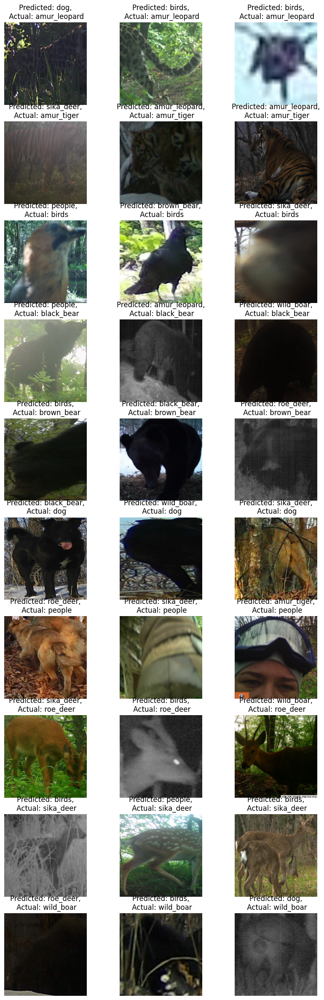

In [29]:
# plot the misclassified images
fig, axes = plt.subplots(len(dataset.classes), 3, figsize=(10, 30))
for i in range(len(dataset.classes)):
    for j in range(3):
        image = transforms.ToPILImage()((((misclassified_images[i][j][0]+1)/2) * 255).squeeze().to(torch.uint8))
        axes[i, j].imshow(image)
        axes[i, j].set_title(f"Predicted: {dataset.get_class_name(misclassified_images[i][j][2])},\n Actual: {dataset.get_class_name(misclassified_images[i][j][1])}")
        axes[i, j].axis('off')
plt.show()

In [54]:
wandb.finish()

minibatch_loss,█▇▇▆▇▆▆▅▅▄▆▄▃▃▃▄▂▃▃▃▄▁▂▂▂▃▁▂▂▂▂▃▁▂▁▁▁▂▁▂
running_loss,▁█▇▇▄▆▆▆▄▅▅▅▃▄▄▄▃▃▃▃▂▃▃▃▂▂▂▂▂▂▂▂▁▁▂▂▁▂▁▂
test_accuracy,▁
train_accuracy,▁▃▄▅▆▇▇█▇█
train_loss,█▆▅▄▃▂▂▁▂▁
val_accuracy,▁▆▆▆▆▇▇█▇█
val_loss,▄▂▂▁▂▃▃▄█▆
f1_score,0.65851
minibatch_loss,0.31152
precision,0.6598
recall,0.65938


## Q2.3 Fine-tuning a pre-trained model

#### Dataset Setup

In [51]:
resnet18_transform = transforms.Compose([
    transforms.Resize([224, 224]),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

In [53]:
train_size = 0.7
val_size = 0.1
test_size = 0.2
batch_size = 16
run_num = 2

In [54]:
dataset = RussianWildLifeDataset(new_path, composed_transform)

In [55]:
class_wise_indices = [np.where(np.array(dataset.labels) == i)[0] for i in range(len(dataset.classes))]
class_distribution = [len(indices) for indices in class_wise_indices]
train_class_distribution = [int(train_size * dist) for dist in class_distribution]
val_class_distribution = [int(val_size * dist) for dist in class_distribution]
test_class_distribution = [int(test_size * dist) for dist in class_distribution]

In [56]:
train_indices = []
val_indices = []
test_indices = []
for i in range(len(dataset.classes)):
    np.random.shuffle(class_wise_indices[i])
    train_indices.extend(np.random.choice(class_wise_indices[i], train_class_distribution[i], replace=False))
    val_indices.extend(np.random.choice(np.setdiff1d(class_wise_indices[i], train_indices), val_class_distribution[i], replace=False))
    test_indices.extend(np.random.choice(np.setdiff1d(class_wise_indices[i], np.concatenate((train_indices, val_indices))), test_class_distribution[i], replace=False))

In [57]:
train_data = Subset(dataset, train_indices)
val_data = Subset(dataset, val_indices)
test_data = Subset(dataset, test_indices)
train_dataloader = DataLoader(train_data, batch_size=batch_size, shuffle=True)
val_dataloader = DataLoader(val_data, batch_size=1, shuffle=True)
test_dataloader = DataLoader(test_data, batch_size=1, shuffle=True)

In [58]:
train_size = len(train_data)
val_size = len(val_data)
test_size = len(test_data)
print(train_size, val_size, test_size)

8973 1276 2560


#### WandB Setup

In [59]:
print(os.getcwd())
os.chdir("..")
os.chdir("..")
print(os.getcwd())

/home/mehar21541/prakhar/pg/cse344/Image Classification/Cropped_final/Cropped_final
/home/mehar21541/prakhar/pg/cse344/Image Classification


In [60]:
import wandb
wandb.login()

True

In [61]:
model_config = dict(
    epochs=15,
    classes=10,
    batch_size=batch_size,
    optimizer="Adam",
    learning_rate=0.001,
    dataset="Russian WildLife Dataset",
    architecture="Resnet18", 
    data_augmentation="False",
    weight_initialisation="Default")

In [62]:
wandb.init(
    project = "Computer_Vision_A1",
    config = model_config,
)

#### Data Visualization

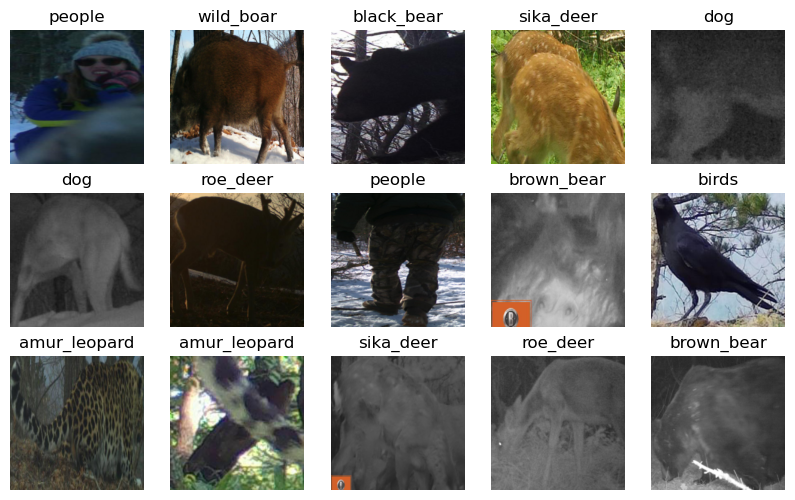

In [63]:
data_visualization(train_data)

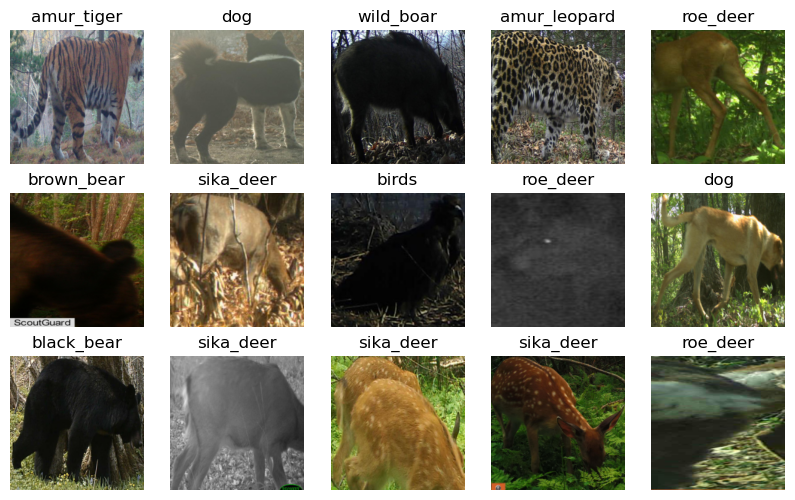

In [64]:
data_visualization(val_data)

#### Model Training

In [66]:
model = torchvision.models.resnet18(weights=torchvision.models.ResNet18_Weights.IMAGENET1K_V1)
for param in model.parameters():
    param.requires_grad = False
model.fc = nn.Linear(model.fc.in_features, 10)
model = model.to(device)
loss_fn = nn.CrossEntropyLoss()
loss_fn.to(device)
optimizer = optim.Adam(model.parameters())

In [67]:
wandb.watch(model)

[]

In [68]:
def train_model(model, model_config, loss_fn, optimizer, train_dataloader, val_dataloader):
    running_loss = 0.0
    model.train()
    for epoch in range(model_config['epochs']):
        for i, sample in enumerate(train_dataloader, 0):
            inputs = sample['image']
            labels = sample['label']
            inputs = inputs.to(device)
            labels = torch.tensor(labels).to(device)
            # zero the gradients before backprop
            optimizer.zero_grad()
            # forward pass
            logits = model.forward(inputs)
            loss = loss_fn(logits, labels)
            # backward pass
            loss.backward()
            optimizer.step()
            minibatch_loss = loss.item()
            running_loss += minibatch_loss
            # logging the minibatch after every batch, and running loss after every 100 minibatches
            wandb.log({'minibatch_loss': minibatch_loss})
            if (i%100==0):
                wandb.log({'running_loss': running_loss / 100})
                running_loss = 0.0
        # log the training accuracy and loss
        correct, total, loss = loss_acc_calc(train_dataloader)
        wandb.log({'train_loss': loss / len(train_dataloader), 'train_accuracy': (correct / total) * 100.0})
        # log the validation accuracy and loss
        correct, total, loss = loss_acc_calc(val_dataloader)
        wandb.log({'val_loss': loss / len(val_dataloader), 'val_accuracy': (correct / total) * 100.0})
    # save the model after training
    torch.save(model.state_dict(), f"A1_Q2_ResNet18_Experiment_{run_num}.pth")
    return model

In [69]:
model = train_model(model, model_config, loss_fn, optimizer, train_dataloader, val_dataloader)

#### Evaluation 

In [70]:
# testing the model 
correct, total, loss = loss_acc_calc(test_dataloader)
print(f"Test Accuracy: {(correct / total) * 100.0}%")
wandb.log({'test_accuracy': (correct / total) * 100.0})
# calculate the metrics
y_true, y_pred = evaluation_metris_calc(test_dataloader)
f1 = f1_score(y_true, y_pred, average='weighted')
precision = precision_score(y_true, y_pred, average='weighted')
recall = recall_score(y_true, y_pred, average='weighted')
print(f"F1 Score: {f1}")
print(f"Precision: {precision}")
print(f"Recall: {recall}")
# logging the metrics onto wandb
wandb.run.summary["test_accuracy"] = (correct / total) * 100.0
wandb.run.summary["f1_score"] = f1
wandb.run.summary["precision"] = precision
wandb.run.summary["recall"] = recall

Test Accuracy: 79.1015625%
F1 Score: 0.7901184833394301
Precision: 0.7983836335072794
Recall: 0.791015625


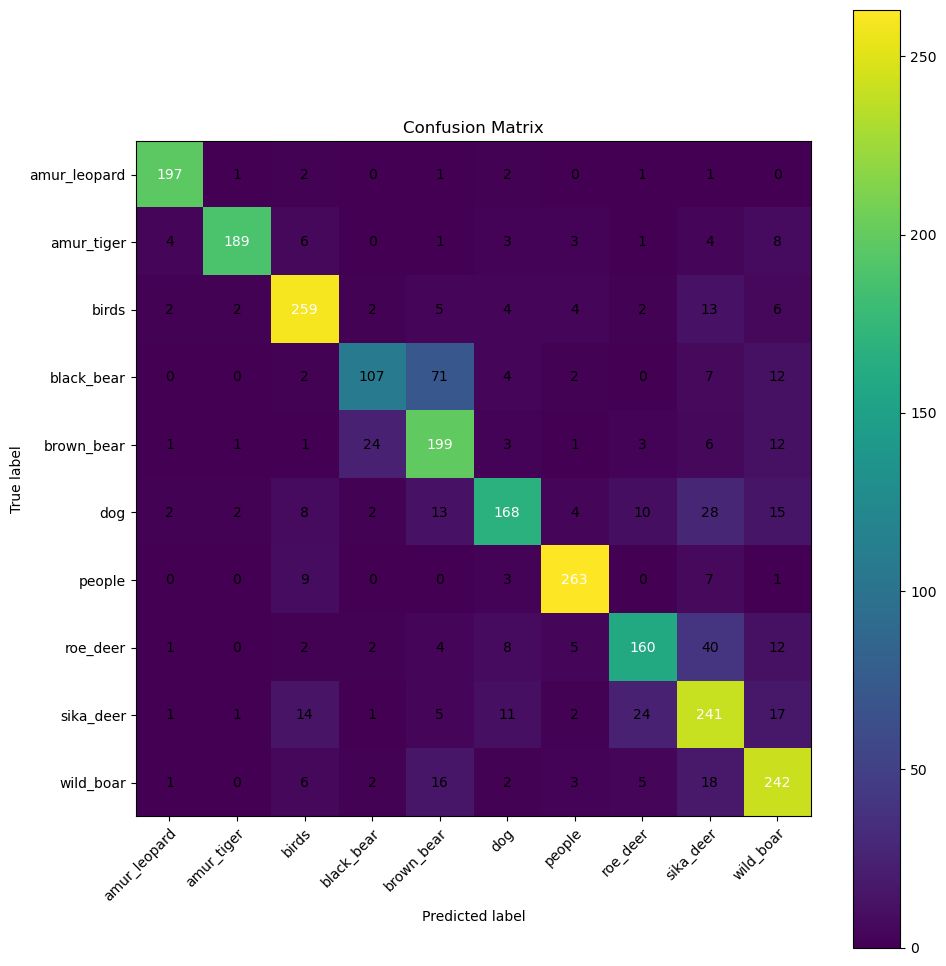

In [71]:
# plot the confusion matrix for the test set
plotting_confusion_matrix(test_dataloader, f"A1_Q2_ResNet18_Experiment_{run_num}_Confusion_Matrix")

In [72]:
wandb.finish()

minibatch_loss,▆█▃▅▃▆▄▇▄▄▃▃▆▃▂▅▃▃▃▃▃▃▂▃▇▂▃▄▃▃▂▃▂▅▃▃▅▁▂▃
running_loss,▁█▇▄▅▅▄▄▃▄▄▄▄▄▄▄▃▄▄▄▄▃▄▃▂▃▃▃▃▂▃▃▃▃▃▃▃▂▃▃
test_accuracy,▁
train_accuracy,▁▄▅▆▆▆▆▇█▇█▇███
train_loss,█▆▄▃▃▃▃▂▂▂▂▂▁▁▁
val_accuracy,▁▅▇▇█▇▆▇▇▇▆▅▇▅▆
val_loss,█▅▂▂▁▂▂▂▂▃▂▄▂▃▂
f1_score,0.79012
minibatch_loss,0.08917
precision,0.79838
recall,0.79102


#### Feature Extraction and TSNE Plots


In [73]:
def feature_extraction(model, dataloader, n_comp):
    model.eval()
    with torch.no_grad():
        features = []
        labels = []
        for i, sample in enumerate(dataloader, 0):
            images = sample['image']
            labels.extend(sample['label'])
            images = images.to(device)
            forwards = model.forward(images)
            features.extend(forwards.cpu().numpy())
        features = np.array(features)
        labels = np.array(labels)
        data_tsne = TSNE(n_components=n_comp)
        features = data_tsne.fit_transform(features)
        return features, labels

In [74]:
training_features, training_labels = feature_extraction(model, train_dataloader, 2)
val_features, val_labels = feature_extraction(model, val_dataloader, 2)

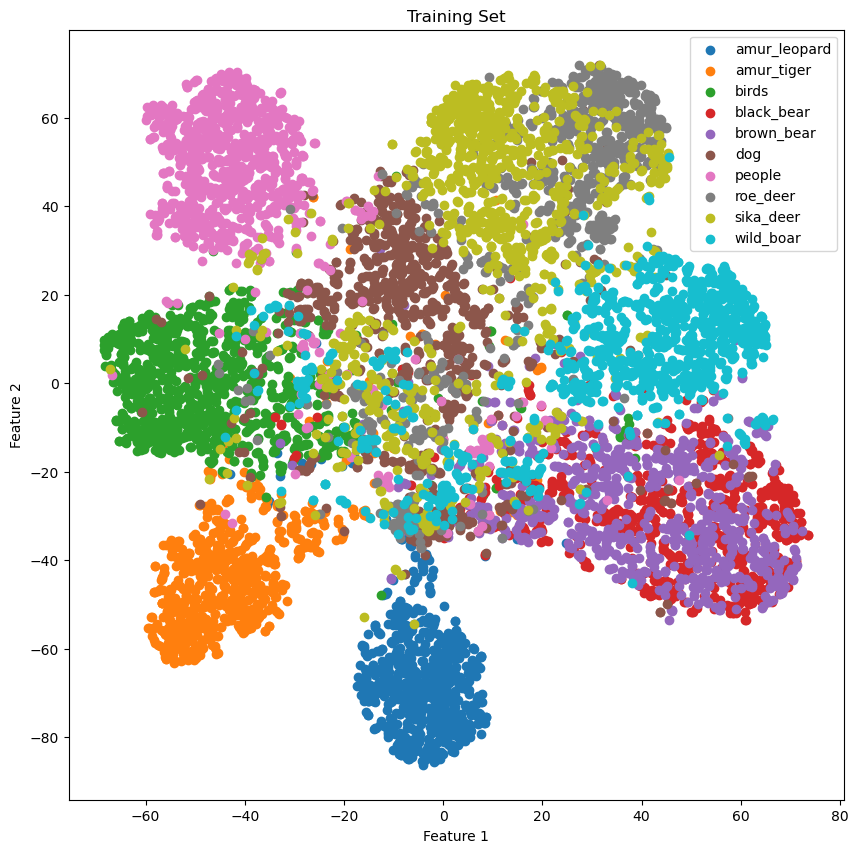

<Figure size 640x480 with 0 Axes>

In [75]:
plt.figure(figsize=(10, 10))
for i in range(len(dataset.classes)):
    indices = np.where(training_labels == i)
    plt.scatter(training_features[indices, 0], training_features[indices, 1], label=dataset.get_class_name(i))
plt.title("Training Set")
plt.xlabel("Feature 1")
plt.ylabel("Feature 2")
plt.legend()
plt.show()
plt.savefig(f"A1_Q2_ResNet18_Experiment_{run_num}_Training_TSNE_2D.png")

In [76]:
training_features, training_labels = feature_extraction(model, train_dataloader, 3)
val_features, val_labels = feature_extraction(model, val_dataloader, 3)

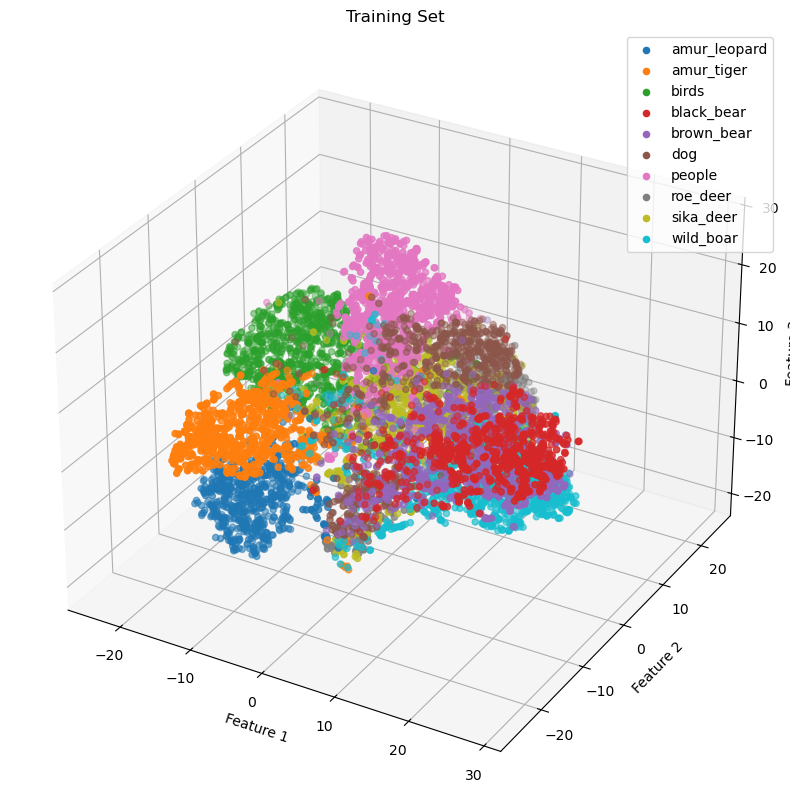

<Figure size 640x480 with 0 Axes>

In [77]:
plt.figure(figsize=(10, 10))
ax = plt.axes(projection='3d')
for i in range(len(dataset.classes)):
    indices = np.where(training_labels == i)
    ax.scatter3D(training_features[indices, 0], training_features[indices, 1], training_features[indices, 2], label=dataset.get_class_name(i))
ax.set_title("Training Set")
ax.set_xlabel("Feature 1")
ax.set_ylabel("Feature 2")
ax.set_zlabel("Feature 3")
plt.legend()
plt.show()
plt.savefig(f"A1_Q2_ResNet18_Experiment_{run_num}_Training_TSNE_3D.png")

#### Misclassification Analysis

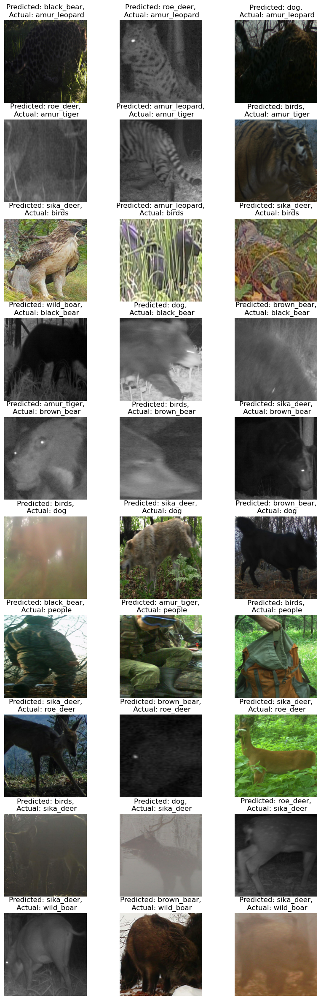

In [ ]:
# plot the misclassified images
fig, axes = plt.subplots(len(dataset.classes), 3, figsize=(10, 30))
for i in range(len(dataset.classes)):
    for j in range(3):
        image = transforms.ToPILImage()((((misclassified_images[i][j][0]+1)/2) * 255).squeeze().to(torch.uint8))
        axes[i, j].imshow(image)
        axes[i, j].set_title(f"Predicted: {dataset.get_class_name(misclassified_images[i][j][2])},\n Actual: {dataset.get_class_name(misclassified_images[i][j][1])}")
        axes[i, j].axis('off')
plt.show()

## Q2.4 Data Augmentation

#### Dataset Preparation

In [8]:
composed_transform = transforms.Compose([
    transforms.Resize([224, 224]), 
    transforms.ToTensor(), 
    transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])
])

In [10]:
train_size = 0.7
val_size = 0.1
test_size = 0.2
batch_size = 16
run_num = 2

In [11]:
dataset = RussianWildLifeDataset(new_path, composed_transform)

In [12]:
class_wise_indices = [np.where(np.array(dataset.labels) == i)[0] for i in range(len(dataset.classes))]
class_distribution = [len(indices) for indices in class_wise_indices]
train_class_distribution = [int(train_size * dist) for dist in class_distribution]
val_class_distribution = [int(val_size * dist) for dist in class_distribution]
test_class_distribution = [int(test_size * dist) for dist in class_distribution]

In [13]:
train_indices = []
val_indices = []
test_indices = []
for i in range(len(dataset.classes)):
    np.random.shuffle(class_wise_indices[i])
    train_indices.extend(np.random.choice(class_wise_indices[i], train_class_distribution[i], replace=False))
    val_indices.extend(np.random.choice(np.setdiff1d(class_wise_indices[i], train_indices), val_class_distribution[i], replace=False))
    test_indices.extend(np.random.choice(np.setdiff1d(class_wise_indices[i], np.concatenate((train_indices, val_indices))), test_class_distribution[i], replace=False))

In [14]:
train_data = Subset(dataset, train_indices)
val_data = Subset(dataset, val_indices)
test_data = Subset(dataset, test_indices)
train_dataloader = DataLoader(train_data, batch_size=batch_size, shuffle=True)
val_dataloader = DataLoader(val_data, batch_size=1, shuffle=True)
test_dataloader = DataLoader(test_data, batch_size=1, shuffle=True)

#### Data Augmentation

In [15]:
augmentation_transform1 = transforms.Compose([
    transforms.Resize([256, 256]), 
    transforms.RandomCrop(224),
    transforms.RandomHorizontalFlip(p=0.5), 
    transforms.RandomRotation(30),
    transforms.ToTensor(), 
    transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])
])

In [16]:
# apply augmentation transforms to current train data and create new train dataset
augmentation_train_data = []
for sample in train_data:
    image = sample['image']
    label = sample['label']
    augmentation_train_data.append({'image': augmentation_transform1(image), 'label': label})
augmentation_train_data = torch.utils.data.ConcatDataset([train_data, augmentation_train_data])
augmentation_train_dataloader = DataLoader(augmentation_train_data, batch_size=batch_size, shuffle=True)

#### Data Visualization

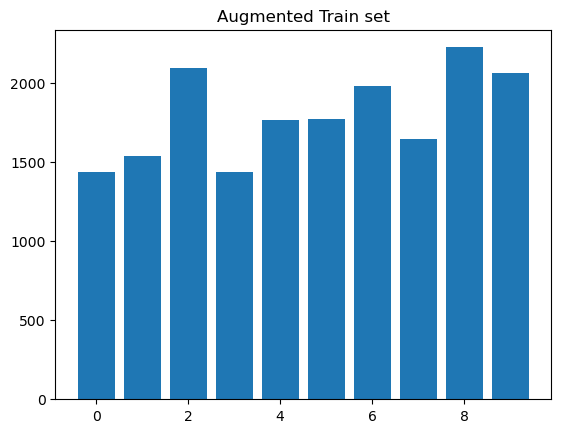

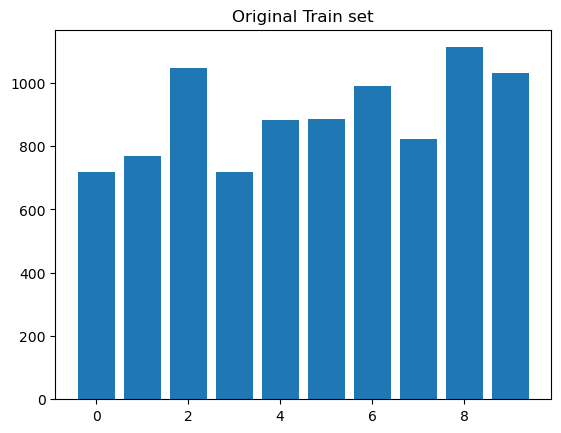

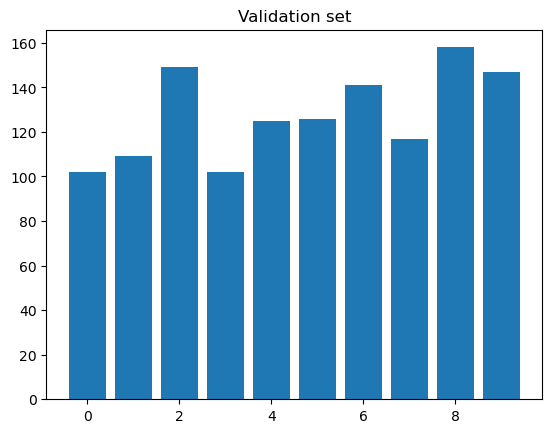

In [20]:
plot_distribution(augmentation_train_data, 'Augmented Train set')
plot_distribution(train_data, 'Original Train set')
plot_distribution(val_data, 'Validation set')

In [21]:
augmented_train_size = len(augmentation_train_data)
original_train_size = len(train_data)
val_size = len(val_data)
test_size = len(test_data)
print(augmented_train_size, original_train_size, val_size, test_size)

17946 8973 1276 2560


#### WandB Setup

In [22]:
print(os.getcwd())
os.chdir("..")
os.chdir("..")
print(os.getcwd())

/home/mehar21541/prakhar/pg/cse344/Image Classification/Cropped_final/Cropped_final
/home/mehar21541/prakhar/pg/cse344/Image Classification


In [23]:
import wandb
wandb.login()

Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.


wandb: Currently logged in as: prakhar432. Use `wandb login --relogin` to force relogin


True

In [24]:
model_config = dict(
    epochs=15,
    classes=10,
    batch_size=batch_size,
    optimizer="Adam",
    learning_rate=0.001,
    dataset="Russian WildLife Dataset",
    architecture="ResNet18",
    data_augmentation="True",
    weight_initialisation="Default")

In [25]:
wandb.init(
    project = "Computer_Vision_A1",
    config = model_config,
)

#### Dataset Visualization

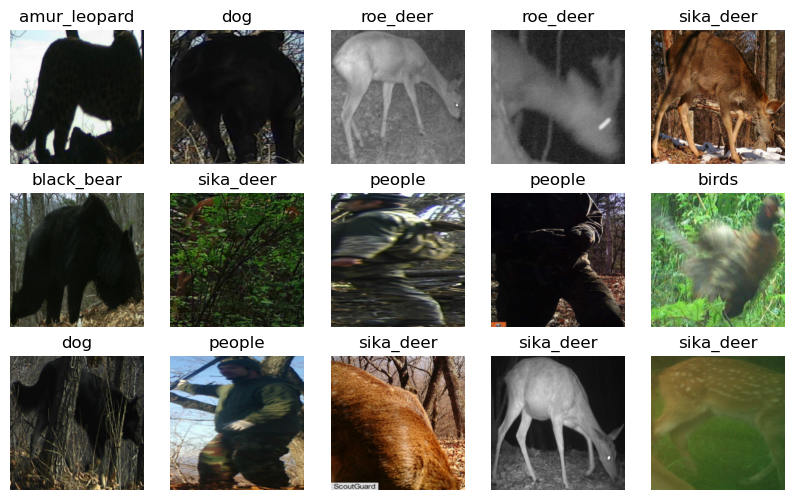

In [28]:
data_visualization(augmentation_train_data)

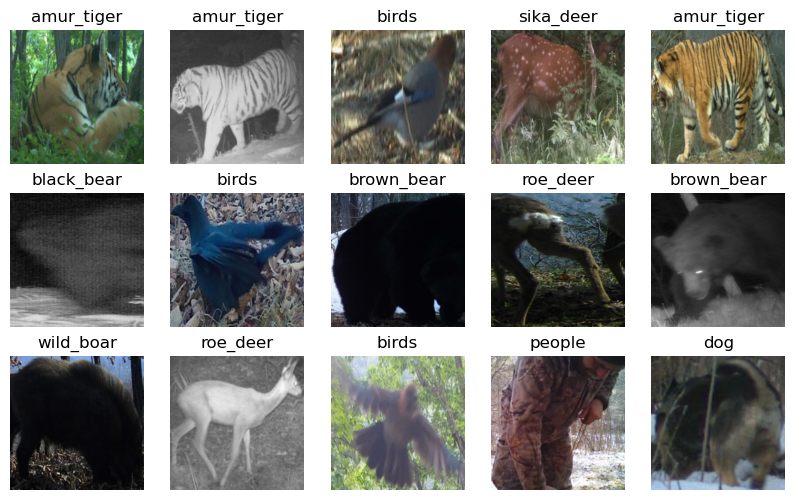

In [29]:
data_visualization(train_data)

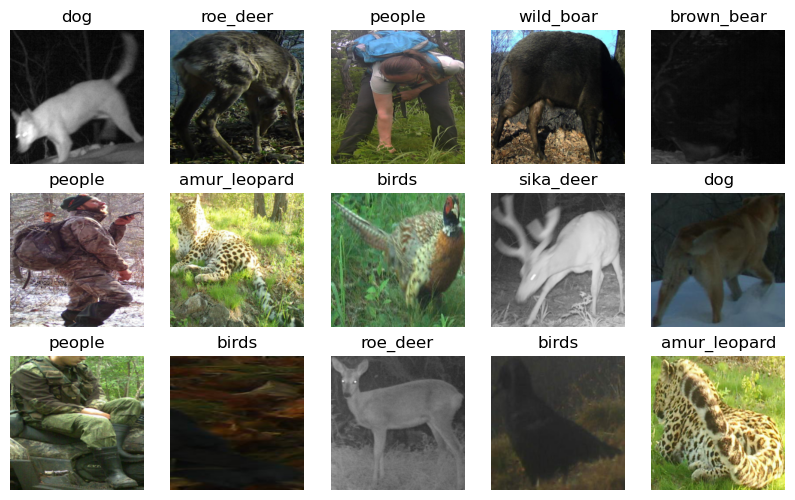

In [30]:
data_visualization(val_data)

In [31]:
model = torchvision.models.resnet18(weights=torchvision.models.ResNet18_Weights.IMAGENET1K_V1)
for param in model.parameters():
    param.requires_grad = False
model.fc = nn.Linear(model.fc.in_features, 10)
model = model.to(device)
loss_fn = nn.CrossEntropyLoss()
loss_fn.to(device)
optimizer = optim.Adam(model.parameters())

In [32]:
wandb.watch(model)

[]

#### Model Training

In [33]:
def train_model_augmented(model, model_config, loss_fn, optimizer, augmented_dataloader, train_dataloader, val_dataloader):
    running_loss = 0.0
    model.train()
    for epoch in range(model_config['epochs']):
        for i, sample in enumerate(augmented_dataloader, 0):
            inputs = sample['image']
            labels = sample['label']
            inputs = inputs.to(device)
            labels = torch.tensor(labels).to(device)
            # zero the gradients before backprop
            optimizer.zero_grad()
            # forward pass
            logits = model.forward(inputs)
            loss = loss_fn(logits, labels)
            # backward pass
            loss.backward()
            optimizer.step()
            minibatch_loss = loss.item()
            running_loss += minibatch_loss
            # logging the minibatch after every batch, and running loss after every 100 minibatches
            wandb.log({'minibatch_loss': minibatch_loss})
            if (i%100==0):
                wandb.log({'running_loss': running_loss / 100})
                running_loss = 0.0
        # log the training accuracy and loss
        correct, total, loss = loss_acc_calc(train_dataloader)
        wandb.log({'train_loss': loss / len(train_dataloader), 'train_accuracy': (correct / total) * 100.0})
        # log the validation accuracy and loss
        correct, total, loss = loss_acc_calc(val_dataloader)
        wandb.log({'val_loss': loss / len(val_dataloader), 'val_accuracy': (correct / total) * 100.0})
    # save the model after training
    torch.save(model.state_dict(), f"A1_Q2_ResNet_DAG_Experiment_1.pth")
    return model

In [47]:
model = train_model_augmented(model, model_config, loss_fn, optimizer, augmentation_train_dataloader, train_dataloader, val_dataloader)

#### Evaluation

In [48]:
# testing the model 
correct, total, loss = loss_acc_calc(test_dataloader)
print(f"Test Accuracy: {(correct / total) * 100.0}%")
wandb.log({'test_accuracy': (correct / total) * 100.0})
# calculate the metrics
y_true, y_pred = evaluation_metris_calc(test_dataloader)
f1 = f1_score(y_true, y_pred, average='weighted')
precision = precision_score(y_true, y_pred, average='weighted')
recall = recall_score(y_true, y_pred, average='weighted')
print(f"F1 Score: {f1}")
print(f"Precision: {precision}")
print(f"Recall: {recall}")
# logging the metrics onto wandb
wandb.run.summary["test_accuracy"] = (correct / total) * 100.0
wandb.run.summary["f1_score"] = f1
wandb.run.summary["precision"] = precision
wandb.run.summary["recall"] = recall

Test Accuracy: 78.1640625%
F1 Score: 0.7806122857258431
Precision: 0.7874506418194003
Recall: 0.781640625


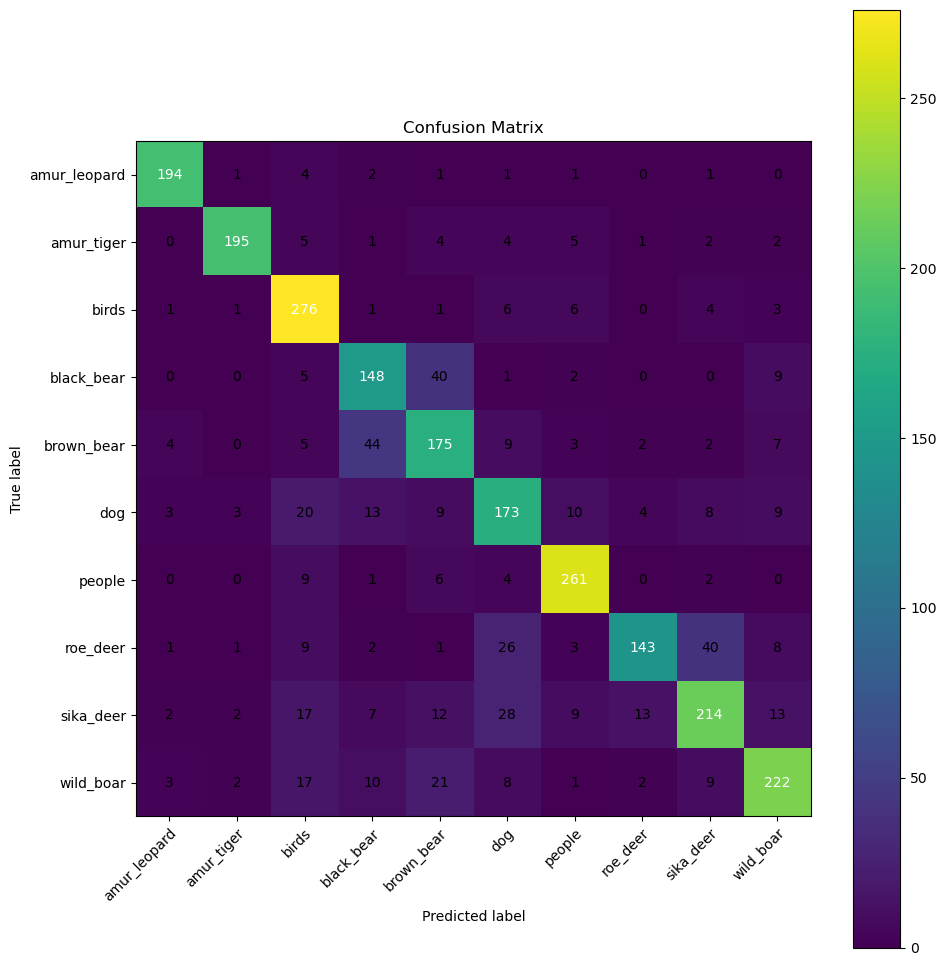

In [49]:
# plot the confusion matrix for the test set
plotting_confusion_matrix(test_dataloader, f"A1_Q2_ResNet_DAG_Experiment_{run_num}_Confusion_Matrix")

In [50]:
wandb.finish()

minibatch_loss,▅█▆▇▆█▅▄▇▄▂▄▃▃▆▃▇▇▁▃▃▂▃▄▁█▃▄▃▂▁▄▃▄▃▂▄▂▄▂
running_loss,█▄▃▃▃▂▂▂▂▂▂▂▂▂▂▁▂▂▁▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
test_accuracy,▁
train_accuracy,▁▄▃▂▆▆▆▆▅▅▇█▇▅▇
train_loss,█▅▅▇▃▃▃▂▄▃▁▁▂▃▁
val_accuracy,▄▆▄▁▇█▆█▃▄█▇▆▅█
val_loss,▇▃▃█▁▁▂▂▅▄▁▁▃▅▃
f1_score,0.78061
minibatch_loss,0.43295
precision,0.78745
recall,0.78164


## Q2.5 BONUS

In [34]:
CNN_model = ConvNet()
CNN_model.load_state_dict(torch.load('A1_Q2_CNN_Experiment_2.pth'))
CNN_model.to(device)
ResNet_Model = torchvision.models.resnet18(weights=torchvision.models.ResNet18_Weights.IMAGENET1K_V1)
ResNet_Model.fc = nn.Linear(ResNet_Model.fc.in_features, 10)
ResNet_Model.load_state_dict(torch.load('A1_Q2_ResNet18_Experiment_1.pth'))
ResNet_Model.to(device)
ResNet_DAG_Model = torchvision.models.resnet18(weights=torchvision.models.ResNet18_Weights.IMAGENET1K_V1)
ResNet_DAG_Model.fc = nn.Linear(ResNet_DAG_Model.fc.in_features, 10)
ResNet_DAG_Model.load_state_dict(torch.load('A1_Q2_ResNet_DAG_Experiment_1.pth'))
ResNet_DAG_Model.to(device)

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
  

In [35]:
class_wise_misclassified = {i: [] for i in range(len(dataset.classes))}
for i, sample in enumerate(test_dataloader, 0):
    image = sample['image']
    label = sample['label']
    image = image.to(device)
    label = torch.tensor(label).to(device)
    forwards = CNN_model.forward(image)
    logits = torch.nn.functional.softmax(forwards, dim=1)
    pred = torch.argmax(logits, dim=1)
    label = int(label.cpu().numpy())
    pred = int(pred.cpu().numpy())
    if (label != pred):
        if (len(class_wise_misclassified[label]) < 3):
            class_wise_misclassified[label].append([image, forwards, label, pred])

{0: [[tensor([[[[-0.6000, -0.6392, -0.5765,  ..., -0.3569, -0.4510, -0.4745],
          [-0.5922, -0.6000, -0.5216,  ..., -0.3961, -0.5373, -0.4353],
          [-0.5843, -0.5843, -0.4980,  ..., -0.4196, -0.5137, -0.5137],
          ...,
          [-0.7255, -0.7647, -0.7333,  ..., -0.7804, -0.7882, -0.8510],
          [-0.7412, -0.7255, -0.7020,  ..., -0.5765, -0.7725, -0.8353],
          [-0.7569, -0.7490, -0.6863,  ..., -0.5922, -0.7333, -0.8667]],

         [[-0.5059, -0.5451, -0.4196,  ...,  0.0588,  0.0039, -0.0039],
          [-0.5216, -0.5059, -0.3412,  ..., -0.0667, -0.1216,  0.0039],
          [-0.5216, -0.4745, -0.2863,  ..., -0.1529, -0.0902, -0.0431],
          ...,
          [-0.6078, -0.6706, -0.6863,  ..., -0.6392, -0.7647, -0.7255],
          [-0.6471, -0.6314, -0.6314,  ..., -0.2549, -0.4980, -0.3020],
          [-0.6941, -0.6549, -0.6078,  ..., -0.1922, -0.0196, -0.0588]],

         [[-0.6235, -0.6706, -0.6000,  ..., -0.1922, -0.2941, -0.3333],
          [-0.6314, -0.6

In [37]:
# finding the centroid of each class
class_centroids = []
with torch.no_grad():
    for i in range(len(dataset.classes)):
        class_images = []
        for sample in test_data:
            if (sample['label'] == i):
                class_images.append(sample['image'])
        class_images = torch.stack(class_images)
        forwards = CNN_model.forward(class_images.to(device))
        class_centroids.append(torch.mean(forwards, dim=0))
class_centroids = torch.stack(class_centroids)
print(class_centroids)

tensor([[ -0.1307,  -9.1642, -11.4565, -21.5293, -20.0910, -13.3327, -14.8654,
         -14.3978, -13.9909, -20.1957],
        [ -9.1213,   0.8674, -12.6413, -21.1036, -18.9029, -12.8150, -16.0344,
         -12.8684, -12.3585, -18.2917],
        [-15.0505, -15.2787,  -2.3149, -23.2098, -22.8024, -14.4391, -15.2664,
         -20.0343, -15.9403, -20.7509],
        [-14.1374, -14.8708, -15.7716,  -0.8233,  -9.7607, -12.1128, -14.7085,
         -16.0183, -14.2227, -12.3076],
        [-12.4467, -12.3385, -14.5156,  -8.9959,  -1.9177, -10.2755, -13.7271,
         -14.0930, -11.6397, -10.7015],
        [-15.9628, -14.0658, -15.7883, -18.1620, -18.2166,  -3.7707, -14.8315,
         -12.7532, -11.6030, -16.0547],
        [-28.2355, -26.0425, -24.7439, -28.1818, -29.6628, -22.6722,  -6.5373,
         -26.1176, -24.4962, -28.9340],
        [-15.8477, -13.2547, -17.3756, -18.0900, -18.4757, -12.1242, -16.9480,
          -2.3944, -10.0147, -14.8736],
        [-16.7760, -14.9708, -16.2096, -20.0822,

CNN
Predicted:  birds , Actual:  amur_leopard
Distance from ground truth:  24.12
Distance from prediction:  13.64
ResNet18
Predicted:  sika_deer , Actual:  amur_leopard
Distance from ground truth:  40.99
Distance from prediction:  47.85
ResNet18 DAG
Predicted:  dog , Actual:  amur_leopard
Distance from ground truth:  34.43
Distance from prediction:  39.48



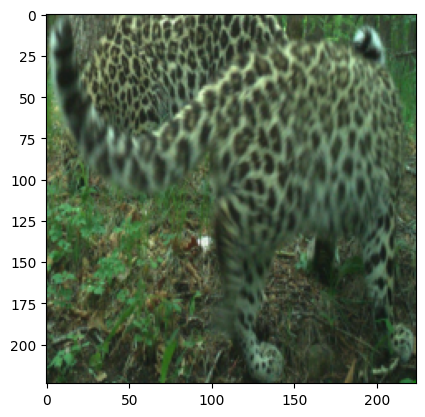

CNN
Predicted:  dog , Actual:  amur_leopard
Distance from ground truth:  20.47
Distance from prediction:  15.2
ResNet18
Predicted:  sika_deer , Actual:  amur_leopard
Distance from ground truth:  40.93
Distance from prediction:  38.83
ResNet18 DAG
Predicted:  dog , Actual:  amur_leopard
Distance from ground truth:  34.32
Distance from prediction:  30.34



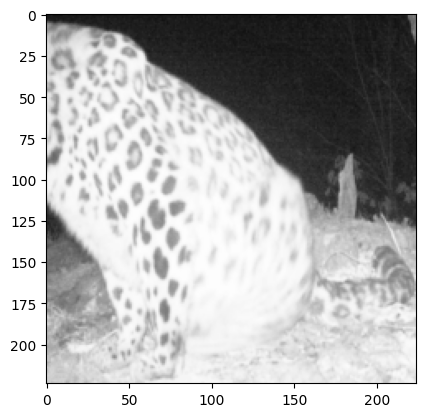

CNN
Predicted:  birds , Actual:  amur_leopard
Distance from ground truth:  58.07
Distance from prediction:  49.22
ResNet18
Predicted:  sika_deer , Actual:  amur_leopard
Distance from ground truth:  40.98
Distance from prediction:  47.87
ResNet18 DAG
Predicted:  dog , Actual:  amur_leopard
Distance from ground truth:  34.63
Distance from prediction:  39.68



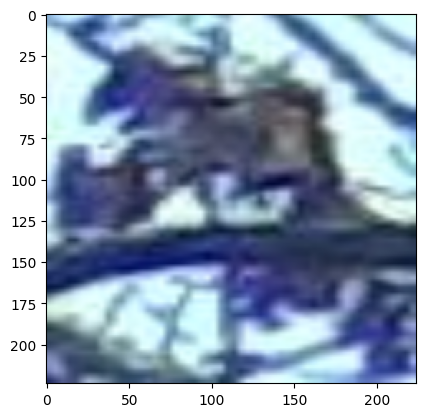

CNN
Predicted:  birds , Actual:  amur_tiger
Distance from ground truth:  30.76
Distance from prediction:  18.81
ResNet18
Predicted:  sika_deer , Actual:  amur_tiger
Distance from ground truth:  38.95
Distance from prediction:  47.86
ResNet18 DAG
Predicted:  dog , Actual:  amur_tiger
Distance from ground truth:  32.35
Distance from prediction:  39.58



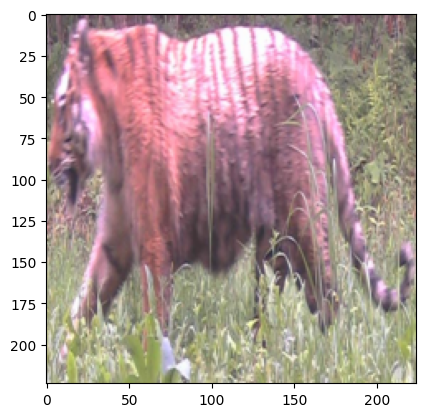

CNN
Predicted:  dog , Actual:  amur_tiger
Distance from ground truth:  20.39
Distance from prediction:  21.16
ResNet18
Predicted:  sika_deer , Actual:  amur_tiger
Distance from ground truth:  38.73
Distance from prediction:  38.8
ResNet18 DAG
Predicted:  dog , Actual:  amur_tiger
Distance from ground truth:  32.45
Distance from prediction:  30.3



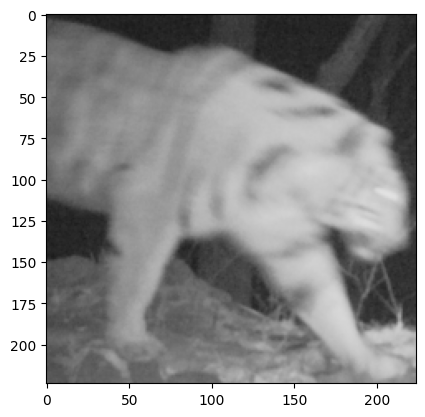

CNN
Predicted:  amur_leopard , Actual:  amur_tiger
Distance from ground truth:  19.73
Distance from prediction:  20.87
ResNet18
Predicted:  sika_deer , Actual:  amur_tiger
Distance from ground truth:  38.69
Distance from prediction:  40.87
ResNet18 DAG
Predicted:  dog , Actual:  amur_tiger
Distance from ground truth:  32.43
Distance from prediction:  34.48



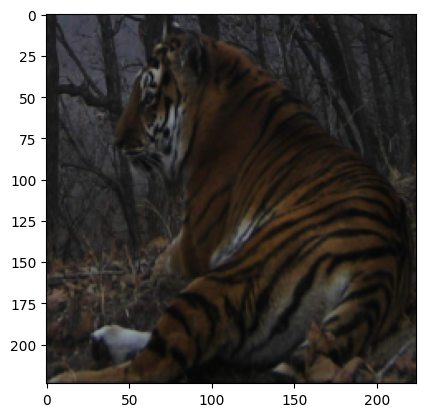

CNN
Predicted:  people , Actual:  birds
Distance from ground truth:  18.55
Distance from prediction:  26.43
ResNet18
Predicted:  sika_deer , Actual:  birds
Distance from ground truth:  47.88
Distance from prediction:  73.54
ResNet18 DAG
Predicted:  dog , Actual:  birds
Distance from ground truth:  39.64
Distance from prediction:  64.2



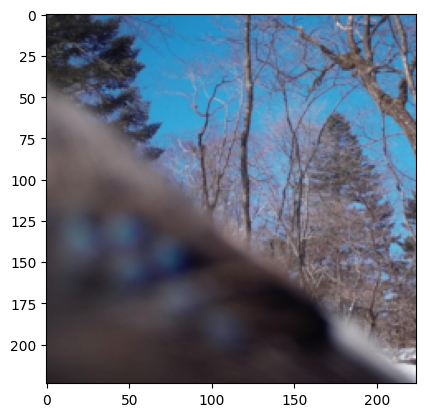

CNN
Predicted:  roe_deer , Actual:  birds
Distance from ground truth:  35.03
Distance from prediction:  25.28
ResNet18
Predicted:  sika_deer , Actual:  birds
Distance from ground truth:  47.85
Distance from prediction:  39.34
ResNet18 DAG
Predicted:  dog , Actual:  birds
Distance from ground truth:  39.61
Distance from prediction:  31.53



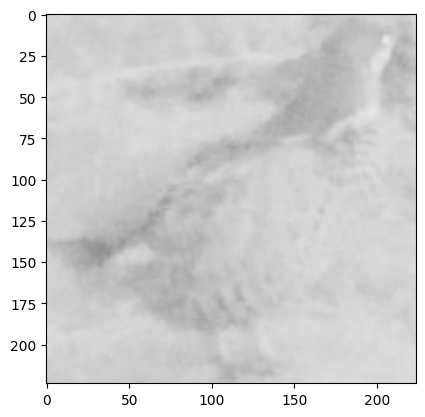

CNN
Predicted:  people , Actual:  birds
Distance from ground truth:  41.43
Distance from prediction:  19.68
ResNet18
Predicted:  sika_deer , Actual:  birds
Distance from ground truth:  47.74
Distance from prediction:  73.45
ResNet18 DAG
Predicted:  dog , Actual:  birds
Distance from ground truth:  39.58
Distance from prediction:  64.16



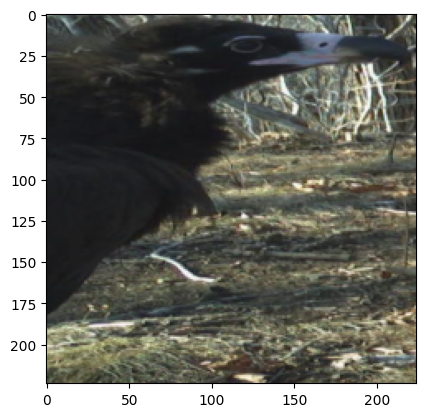

CNN
Predicted:  brown_bear , Actual:  black_bear
Distance from ground truth:  25.24
Distance from prediction:  19.88
ResNet18
Predicted:  sika_deer , Actual:  black_bear
Distance from ground truth:  34.87
Distance from prediction:  29.65
ResNet18 DAG
Predicted:  dog , Actual:  black_bear
Distance from ground truth:  26.87
Distance from prediction:  21.71



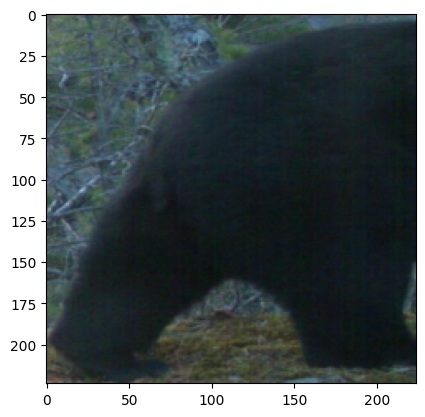

CNN
Predicted:  amur_leopard , Actual:  black_bear
Distance from ground truth:  29.52
Distance from prediction:  36.92
ResNet18
Predicted:  sika_deer , Actual:  black_bear
Distance from ground truth:  34.79
Distance from prediction:  40.94
ResNet18 DAG
Predicted:  dog , Actual:  black_bear
Distance from ground truth:  26.86
Distance from prediction:  34.52



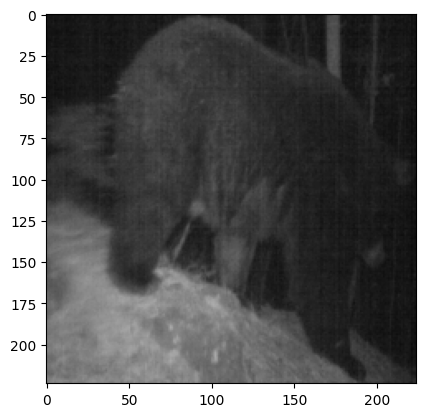

CNN
Predicted:  wild_boar , Actual:  black_bear
Distance from ground truth:  18.76
Distance from prediction:  10.77
ResNet18
Predicted:  sika_deer , Actual:  black_bear
Distance from ground truth:  34.74
Distance from prediction:  31.76
ResNet18 DAG
Predicted:  dog , Actual:  black_bear
Distance from ground truth:  26.97
Distance from prediction:  23.91



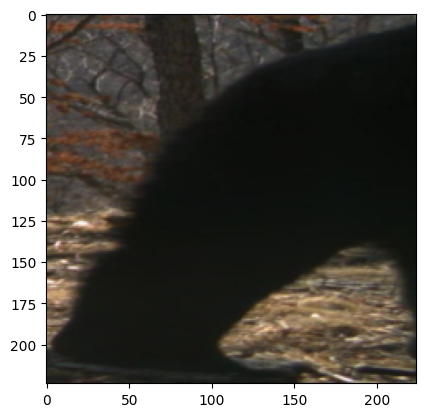

CNN
Predicted:  sika_deer , Actual:  brown_bear
Distance from ground truth:  17.44
Distance from prediction:  28.06
ResNet18
Predicted:  sika_deer , Actual:  brown_bear
Distance from ground truth:  29.47
Distance from prediction:  42.02
ResNet18 DAG
Predicted:  dog , Actual:  brown_bear
Distance from ground truth:  21.88
Distance from prediction:  33.92



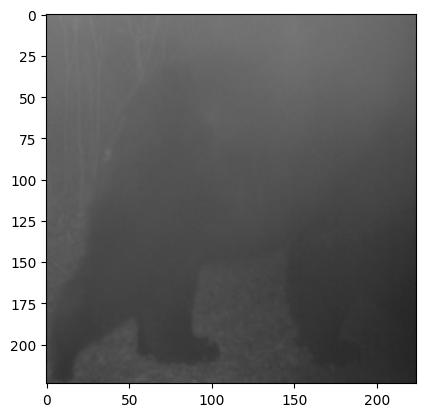

CNN
Predicted:  black_bear , Actual:  brown_bear
Distance from ground truth:  54.69
Distance from prediction:  48.07
ResNet18
Predicted:  sika_deer , Actual:  brown_bear
Distance from ground truth:  29.67
Distance from prediction:  34.88
ResNet18 DAG
Predicted:  dog , Actual:  brown_bear
Distance from ground truth:  21.62
Distance from prediction:  26.84



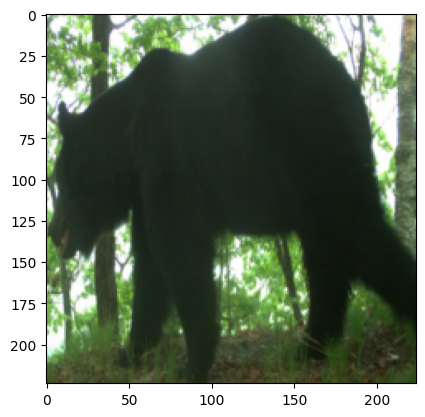

CNN
Predicted:  amur_tiger , Actual:  brown_bear
Distance from ground truth:  28.59
Distance from prediction:  38.23
ResNet18
Predicted:  sika_deer , Actual:  brown_bear
Distance from ground truth:  29.55
Distance from prediction:  38.91
ResNet18 DAG
Predicted:  dog , Actual:  brown_bear
Distance from ground truth:  21.65
Distance from prediction:  32.5



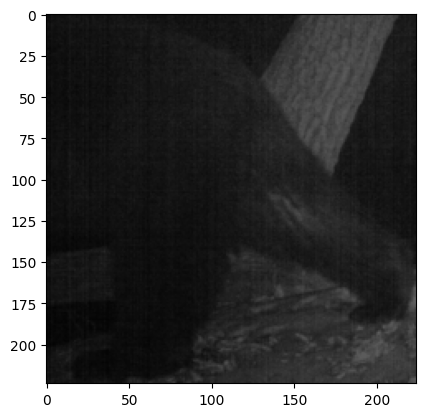

CNN
Predicted:  roe_deer , Actual:  dog
Distance from ground truth:  20.94
Distance from prediction:  19.4
ResNet18
Predicted:  sika_deer , Actual:  dog
Distance from ground truth:  38.81
Distance from prediction:  39.29
ResNet18 DAG
Predicted:  dog , Actual:  dog


AttributeError: 'int' object has no attribute 'item'

In [51]:
for i in class_wise_misclassified.keys():
    for j in range(3):
        image = class_wise_misclassified[i][j][0]
        forwards = class_wise_misclassified[i][j][1]
        label = class_wise_misclassified[i][j][2]
        pred = class_wise_misclassified[i][j][3]
        # ResNet18 
        forwards_resnet = ResNet_Model.forward(image)
        logits_resnet = torch.nn.functional.softmax(forwards_resnet, dim=1)
        pred_resnet = torch.argmax(logits_resnet, dim=1)
        # ResNet18 DAG
        forwards_resnet_dag = ResNet_DAG_Model.forward(image)
        logits_resnet_dag = torch.nn.functional.softmax(forwards_resnet_dag, dim=1)
        pred_resnet_dag = torch.argmax(logits_resnet_dag, dim=1)
        # distance from the centroid
        cnn_distance_gt = torch.dist(forwards, class_centroids[label])
        cnn_distance_pred = torch.dist(forwards, class_centroids[pred])
        resnet_distance_gt = torch.dist(forwards_resnet, class_centroids[label])
        resnet_distance_pred = torch.dist(forwards_resnet, class_centroids[pred])
        resnet_dag_distance_gt = torch.dist(forwards_resnet_dag, class_centroids[label])
        resnet_dag_distance_pred = torch.dist(forwards_resnet_dag, class_centroids[pred])
        label = int(label)
        # CNN
        print("CNN")
        print("Predicted: ", dataset.get_class_name(pred), ", Actual: ", dataset.get_class_name(label))
        print("Distance from ground truth: ", np.round(cnn_distance_gt.item(), 2))
        print("Distance from prediction: ", np.round(cnn_distance_pred.item(), 2))
        # ResNet18
        if (pred_resnet == label):
            resnet_distance_gt = 0
        print("ResNet18")
        print("Predicted: ", dataset.get_class_name(int(pred_resnet.cpu())), ", Actual: ", dataset.get_class_name(label))
        print("Distance from ground truth: ", np.round(resnet_distance_gt.item(), 2))
        print("Distance from prediction: ", np.round(resnet_distance_pred.item(), 2))
        # ResNet18 DAG
        if (pred_resnet_dag == label):
            resnet_dag_distance_gt = 0
        print("ResNet18 DAG")
        print("Predicted: ", dataset.get_class_name(int(pred_resnet_dag.cpu())), ", Actual: ", dataset.get_class_name(label))
        print("Distance from ground truth: ", np.round(resnet_dag_distance_gt.item(), 2))
        print("Distance from prediction: ", np.round(resnet_dag_distance_pred.item(), 2))
        image = class_wise_misclassified[i][j][0]
        image = transforms.ToPILImage()((((image+1)/2) * 255).squeeze().to(torch.uint8))
        # ResNet18 DAG
        print()
        plt.imshow(image)
        plt.show()
        